In [3]:
from scipy.io import loadmat

mat = loadmat("../data/raw/B0005.mat")

print(mat.keys())

dict_keys(['__header__', '__version__', '__globals__', 'B0005'])


In [4]:
battery = mat["B0005"]

print(type(battery))

print(battery.shape)

print(battery.dtype)

<class 'numpy.ndarray'>
(1, 1)
[('cycle', 'O')]


In [5]:
from scipy.io import loadmat

mat = loadmat("../data/raw/B0005.mat")

battery = mat["B0005"]

print(mat.keys())
print(battery.shape)
print(battery.dtype)

dict_keys(['__header__', '__version__', '__globals__', 'B0005'])
(1, 1)
[('cycle', 'O')]


In [6]:
cycle = battery["cycle"]

print(type(cycle))
print(cycle.shape)

<class 'numpy.ndarray'>
(1, 1)


In [7]:
print(type(cycle[0,0]))
print(cycle[0,0])

<class 'numpy.ndarray'>
[[(array(['charge'], dtype='<U6'), array([[24]], dtype=uint8), array([[2.0080e+03, 4.0000e+00, 2.0000e+00, 1.3000e+01, 8.0000e+00,
          1.7921e+01]]), array([[(array([[3.87301722, 3.47939356, 4.00058782, 4.01239519, 4.01970806,
                  4.02540947, 4.03063627, 4.03534896, 4.03971637, 4.04354121,
                  4.04672407, 4.05032083, 4.05347776, 4.05687947, 4.06020401,
                  4.06309148, 4.06606364, 4.06810568, 4.07091089, 4.07314062,
                  4.07531198, 4.07798651, 4.07976022, 4.08180212, 4.08379322,
                  4.08535888, 4.08707793, 4.0888699 , 4.08991841, 4.09204117,
                  4.09327341, 4.09462341, 4.09636787, 4.09755211, 4.09852259,
                  4.09990153, 4.10107397, 4.10186053, 4.10303834, 4.10433761,
                  4.10518719, 4.10617751, 4.10713402, 4.108074  , 4.10876115,
                  4.10971157, 4.11073785, 4.1115377 , 4.11216994, 4.11307997,
                  4.11363282, 4.114555  ,

In [8]:
cycle = battery["cycle"][0,0]

print(cycle.dtype)
print(cycle.shape)

[('type', 'O'), ('ambient_temperature', 'O'), ('time', 'O'), ('data', 'O')]
(1, 616)


In [9]:
types = []

for i in range(cycle.shape[1]):
    types.append(cycle["type"][0,i][0])

print(set(types))

{np.str_('charge'), np.str_('discharge'), np.str_('impedance')}


In [10]:
from collections import Counter

print(Counter(types))

Counter({np.str_('impedance'): 278, np.str_('charge'): 170, np.str_('discharge'): 168})


In [11]:
for i in range(cycle.shape[1]):

    if cycle["type"][0, i][0] == "discharge":

        print("Discharge Index:", i)

        discharge = cycle["data"][0, i]

        print(discharge.dtype)

        break

Discharge Index: 1
[('Voltage_measured', 'O'), ('Current_measured', 'O'), ('Temperature_measured', 'O'), ('Current_load', 'O'), ('Voltage_load', 'O'), ('Time', 'O'), ('Capacity', 'O')]


In [12]:
import pandas as pd
import numpy as np

rows = []

cycle = battery["cycle"][0,0]

cycle_number = 0

for i in range(cycle.shape[1]):

    if cycle["type"][0,i][0] == "discharge":

        cycle_number += 1

        data = cycle["data"][0,i]

        capacity = float(data["Capacity"][0,0][0,0])

        avg_voltage = np.mean(
            data["Voltage_measured"][0,0]
        )

        avg_current = np.mean(
            data["Current_measured"][0,0]
        )

        avg_temp = np.mean(
            data["Temperature_measured"][0,0]
        )

        rows.append([
            cycle_number,
            capacity,
            avg_voltage,
            avg_current,
            avg_temp
        ])

df = pd.DataFrame(
    rows,
    columns=[
        "Cycle",
        "Capacity",
        "AvgVoltage",
        "AvgCurrent",
        "AvgTemp"
    ]
)

df.head()

,Cycle,Capacity,AvgVoltage,AvgCurrent,AvgTemp
0,1,1.856487,3.529829,-1.818702,32.572328
1,2,1.846327,3.537320,-1.817560,32.725235
2,3,1.835349,3.543737,-1.816487,32.642862
3,4,1.835263,3.543666,-1.825589,32.514876
4,5,1.834646,3.542343,-1.826114,32.382349


In [14]:
print(df.shape)
df.head(10)

(168, 5)


,Cycle,Capacity,AvgVoltage,AvgCurrent,AvgTemp
0,1,1.856487,3.529829,-1.818702,32.572328
1,2,1.846327,3.537320,-1.817560,32.725235
2,3,1.835349,3.543737,-1.816487,32.642862
3,4,1.835263,3.543666,-1.825589,32.514876
4,5,1.834646,3.542343,-1.826114,32.382349
5,6,1.835662,3.541335,-1.816811,32.434182
6,7,1.835146,3.541025,-1.816791,32.480416
7,8,1.825757,3.554133,-1.844341,32.410462
8,9,1.824774,3.552936,-1.853973,32.346141
9,10,1.824613,3.551206,-1.853590,32.276798


In [15]:
df[["Cycle","Capacity"]].head()

,Cycle,Capacity
0,1,1.856487
1,2,1.846327
2,3,1.835349
3,4,1.835263
4,5,1.834646


In [16]:
df["SOH"] = (
    df["Capacity"]
    /
    df["Capacity"].iloc[0]
) * 100

In [17]:
max_cycle = df["Cycle"].max()

df["RUL"] = max_cycle - df["Cycle"]

In [19]:
df.head()


,Cycle,Capacity,AvgVoltage,AvgCurrent,AvgTemp,SOH,RUL
0,1,1.856487,3.529829,-1.818702,32.572328,100.000000,167
1,2,1.846327,3.537320,-1.817560,32.725235,99.452721,166
2,3,1.835349,3.543737,-1.816487,32.642862,98.861386,165
3,4,1.835263,3.543666,-1.825589,32.514876,98.856718,164
4,5,1.834646,3.542343,-1.826114,32.382349,98.823482,163


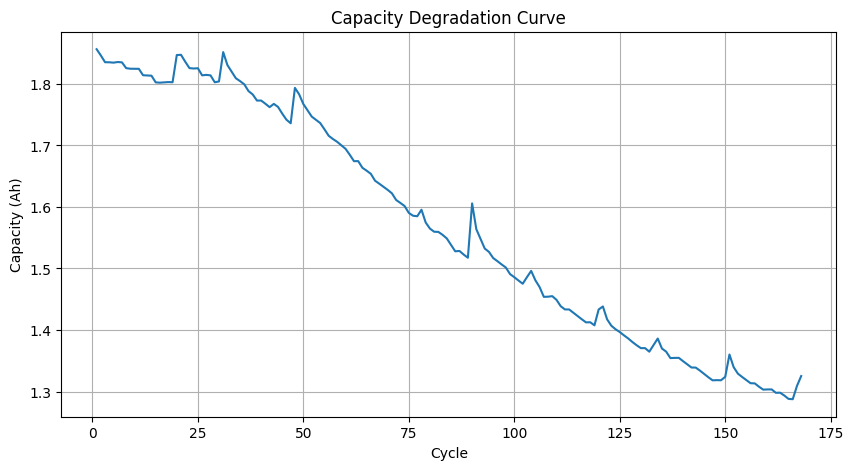

In [20]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10,5))

plt.plot(
    df["Cycle"],
    df["Capacity"]
)

plt.xlabel("Cycle")

plt.ylabel("Capacity (Ah)")

plt.title("Capacity Degradation Curve")

plt.grid(True)

plt.show()

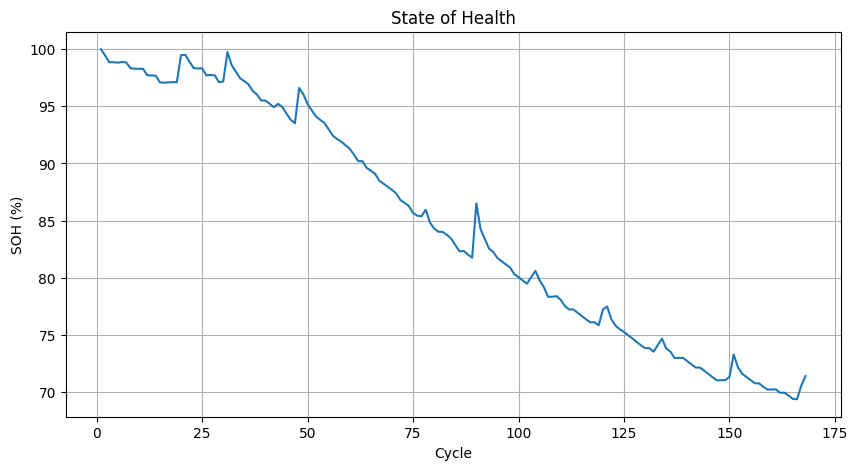

In [21]:
plt.figure(figsize=(10,5))

plt.plot(
    df["Cycle"],
    df["SOH"]
)

plt.xlabel("Cycle")

plt.ylabel("SOH (%)")

plt.title("State of Health")

plt.grid(True)

plt.show()

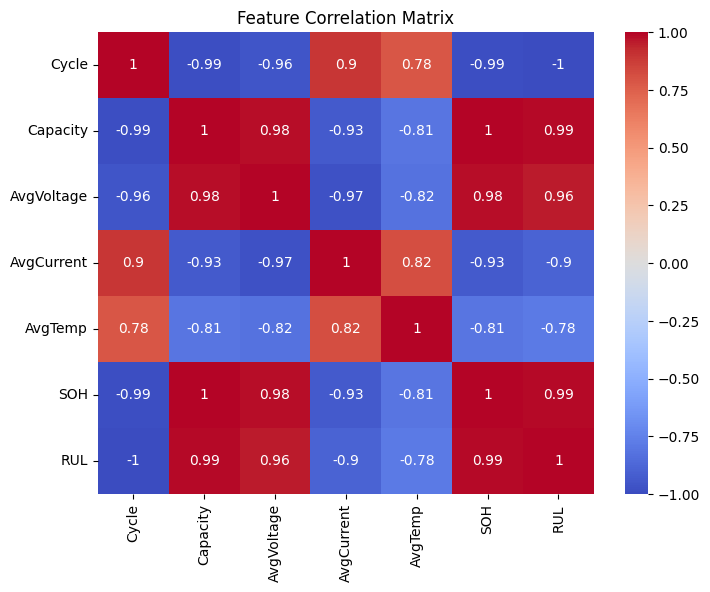

In [22]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(8,6))

sns.heatmap(
    df.corr(numeric_only=True),
    annot=True,
    cmap="coolwarm"
)

plt.title("Feature Correlation Matrix")
plt.show()

In [24]:
df["capacity_drop"] = df["Capacity"].diff()

df["temp_change"] = df["AvgTemp"].diff()

df["voltage_change"] = df["AvgVoltage"].diff()

df["current_change"] = df["AvgCurrent"].diff()

df["rolling_capacity_5"] = (
    df["Capacity"]
    .rolling(window=5)
    .mean()
)

df["rolling_temp_5"] = (
    df["AvgTemp"]
    .rolling(window=5)
    .mean()
)

df["rolling_voltage_5"] = (
    df["AvgVoltage"]
    .rolling(window=5)
    .mean()
)

In [25]:
df = df.dropna()

df.head()

,Cycle,Capacity,AvgVoltage,AvgCurrent,AvgTemp,SOH,RUL,capacity_drop,temp_change,voltage_change,rolling_capacity,current_change,rolling_capacity_5,rolling_temp_5,rolling_voltage_5
4,5,1.834646,3.542343,-1.826114,32.382349,98.823482,163,-0.000617,-0.132527,-0.001323,1.841614,-0.000525,1.841614,32.567530,3.539379
5,6,1.835662,3.541335,-1.816811,32.434182,98.878217,162,0.001016,0.051833,-0.001009,1.837449,0.009303,1.837449,32.539901,3.541680
6,7,1.835146,3.541025,-1.816791,32.480416,98.850449,161,-0.000516,0.046234,-0.000310,1.835213,0.000020,1.835213,32.490937,3.542421
7,8,1.825757,3.554133,-1.844341,32.410462,98.344690,160,-0.009389,-0.069955,0.013108,1.833295,-0.027550,1.833295,32.444457,3.544500
8,9,1.824774,3.552936,-1.853973,32.346141,98.291743,159,-0.000983,-0.064321,-0.001198,1.831197,-0.009632,1.831197,32.410710,3.546354


In [29]:
features = [
    "Capacity",
    "AvgVoltage",
    "AvgCurrent",
    "AvgTemp",
    "capacity_drop",
    "temp_change",
    "voltage_change",
    "current_change",
    "rolling_capacity_5",
    "rolling_temp_5",
    "rolling_voltage_5"
]

target = "SOH"


In [30]:
from sklearn.model_selection import train_test_split

X = df[features]

y = df[target]

X_train, X_test, y_train, y_test = train_test_split(
    X,
    y,
    test_size=0.2,
    random_state=42
)

In [31]:
from xgboost import XGBRegressor

model = XGBRegressor(
    n_estimators=200,
    max_depth=4,
    learning_rate=0.05,
    random_state=42
)

model.fit(X_train, y_train)

,objective,'reg:squarederror'
,base_score,None
,booster,None
,callbacks,None
,colsample_bylevel,None
,colsample_bynode,None
,colsample_bytree,None
,device,None
,early_stopping_rounds,None
,enable_categorical,False
,eval_metric,None


In [40]:
from sklearn.metrics import (
    mean_absolute_error,
    mean_squared_error,
    r2_score
)

preds = model.predict(X_test)

mae = mean_absolute_error(y_test, preds)

rmse = mean_squared_error(
    y_test,
    preds
    # squared=False
)

r2 = r2_score(y_test, preds)

print("MAE =", mae)
print("RMSE =", rmse)
print("R² =", r2)

MAE = 0.28922088491625453
RMSE = 0.15086680882468473
R² = 0.9987066600247971
